<a href="https://colab.research.google.com/github/ismailazdad/uwmgit/blob/main/cocoformat_dataset_creation_instance_segmentation_batch_128_augm_wandb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# This Notebook helps to create a dataset in the cocoformat and also has a visualization with with both coco and detectron API

Reference:
https://www.kaggle.com/code/ammarnassanalhajali/k-fold-crossvalidation-coco-dataset-generator/notebook

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# !rm -rf UW_Madison_segmentation

In [ ]:
!unzip /content/drive/MyDrive/UW_Madison_segmentation/train.zip -d /content/uw-madison-gi-tract-image-segmentation/

In [3]:
!unzip /content/drive/MyDrive/UW_Madison_segmentation/train.csv.zip -d /content/uw-madison-gi-tract-image-segmentation/

Archive:  /content/drive/MyDrive/UW_Madison_segmentation/train.csv.zip
  inflating: /content/uw-madison-gi-tract-image-segmentation/train.csv  


In [4]:
!mkdir working

In [ ]:
!pwd

/content


In [5]:
import json
import numpy as np
import pycocotools.mask as mask_util
from skimage import measure
import os
from tqdm import tqdm
from tqdm.notebook import tqdm
import cv2
import random
from itertools import groupby
import itertools
import pandas as pd
import cv2
from sklearn.model_selection import train_test_split
from tqdm import tqdm
from glob import glob
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import seaborn as sns

In [7]:
# creating a dataframe
path ="/content/uw-madison-gi-tract-image-segmentation/"
# path ="../input/uw-madison-gi-tract-image-segmentation/"
dataset_path = os.path.abspath(path) 
csv_path = os.path.abspath(path+"train.csv")
df = pd.read_csv(csv_path)

def fetch_file_from_id(root_dir, case_id):
    case_folder = case_id.split("_")[0]
    day_folder = "_".join(case_id.split("_")[:2])
    file_starter = "_".join(case_id.split("_")[2:])
    # fetching folder paths
    folder = os.path.join(root_dir, case_folder, day_folder, "scans")
    # fetching filenames with similar pattern
    file = glob(f"{folder}/{file_starter}*")
    # returning the first file, though it will always hold one file.
    return file[0]



# df["segmentation"] = df["segmentation"].astype("str")
df["case_id"] = df["id"].apply(lambda x: x.split("_")[0][4:])
df["day_id"] = df["id"].apply(lambda x: x.split("_")[1][3:])
df["slice_id"] = df["id"].apply(lambda x: x.split("_")[-1])
df["path"] = df["id"].apply(lambda x: fetch_file_from_id(dataset_path, x))
# df["path"] = df["id"].apply(lambda x: fetch_file_from_id(dataset_path+'/train', x))
df["height"] = df["path"].apply(lambda x: os.path.split(x)[-1].split("_")[2]).astype("int")
df["width"] = df["path"].apply(lambda x: os.path.split(x)[-1].split("_")[3]).astype("int")
df['size'] =df['height'].astype(str) +'x'+ df['width'].astype(str)
df.head()

,id,class,segmentation,case_id,day_id,slice_id,path,height,width,size
0,case123_day20_slice_0001,large_bowel,NaN,123,20,0001,/content/uw-madison-gi-tract-image-segmentatio...,266,266,266x266
1,case123_day20_slice_0001,small_bowel,NaN,123,20,0001,/content/uw-madison-gi-tract-image-segmentatio...,266,266,266x266
2,case123_day20_slice_0001,stomach,NaN,123,20,0001,/content/uw-madison-gi-tract-image-segmentatio...,266,266,266x266
3,case123_day20_slice_0002,large_bowel,NaN,123,20,0002,/content/uw-madison-gi-tract-image-segmentatio...,266,266,266x266
4,case123_day20_slice_0002,small_bowel,NaN,123,20,0002,/content/uw-madison-gi-tract-image-segmentatio...,266,266,266x266


In [ ]:
df.shape

(115488, 10)

In [ ]:
df.dtypes

id              object
class           object
segmentation    object
case_id         object
day_id          object
slice_id        object
path            object
height           int64
width            int64
size            object
dtype: object

In [ ]:
(df.notna().mean(axis=0)*100).sort_values(ascending=True)

segmentation     29.364956
id              100.000000
class           100.000000
case_id         100.000000
day_id          100.000000
slice_id        100.000000
path            100.000000
height          100.000000
width           100.000000
size            100.000000
dtype: float64

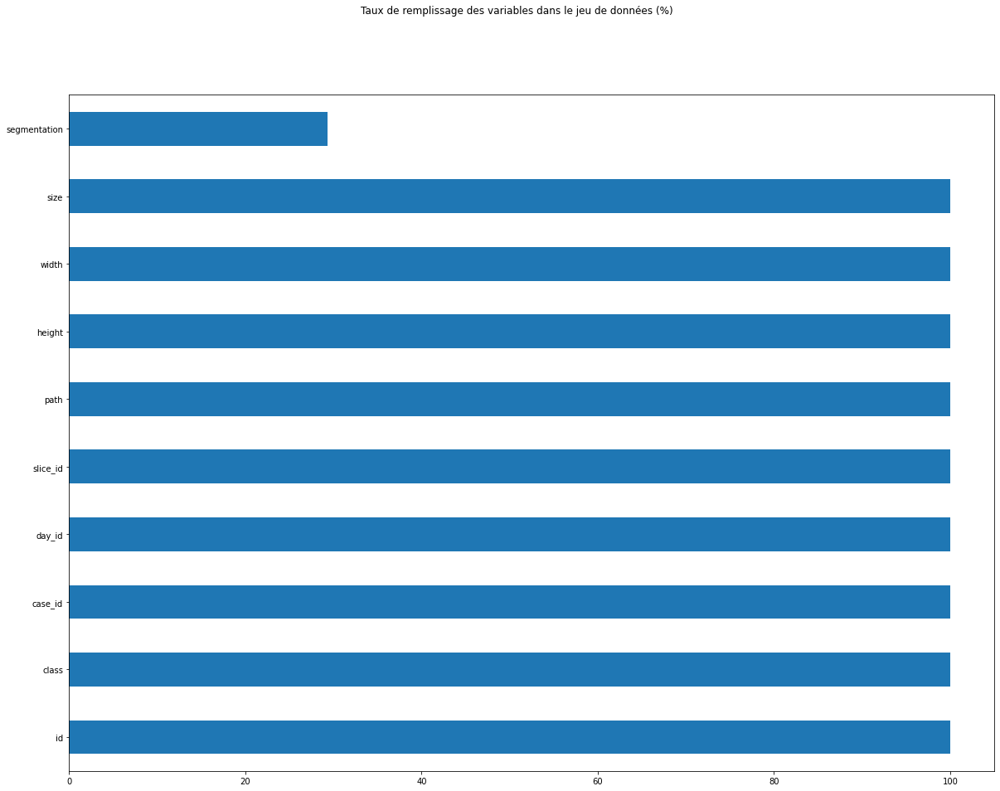

In [ ]:
taux = (df.notna().mean(axis=0)*100).sort_values(ascending=False)
plt.suptitle("Taux de remplissage des variables dans le jeu de données (%)")
taux.plot(kind='barh', figsize=(20, 15))

In [ ]:
df[df['segmentation'].isnull()].shape

(81575, 10)

In [ ]:
df[df['segmentation'].notnull()].shape

(33913, 10)

In [ ]:
df.dtypes

id              object
class           object
segmentation    object
case_id         object
day_id          object
slice_id        object
path            object
height           int64
width            int64
size            object
dtype: object

In [8]:
df_with_mask = df[df['segmentation'].notnull()] 
df_with_mask["segmentation"] = df["segmentation"].astype("str")
df_with_mask = df_with_mask.reset_index(drop=True)    
df_with_mask.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,id,class,segmentation,case_id,day_id,slice_id,path,height,width,size
0,case123_day20_slice_0065,stomach,28094 3 28358 7 28623 9 28889 9 29155 9 29421 ...,123,20,0065,/content/uw-madison-gi-tract-image-segmentatio...,266,266,266x266
1,case123_day20_slice_0066,stomach,27561 8 27825 11 28090 13 28355 14 28620 15 28...,123,20,0066,/content/uw-madison-gi-tract-image-segmentatio...,266,266,266x266
2,case123_day20_slice_0067,stomach,15323 4 15587 8 15852 10 16117 11 16383 12 166...,123,20,0067,/content/uw-madison-gi-tract-image-segmentatio...,266,266,266x266
3,case123_day20_slice_0068,stomach,14792 5 15056 9 15321 11 15587 11 15852 13 161...,123,20,0068,/content/uw-madison-gi-tract-image-segmentatio...,266,266,266x266
4,case123_day20_slice_0069,stomach,14526 6 14789 12 15054 14 15319 16 15584 17 15...,123,20,0069,/content/uw-madison-gi-tract-image-segmentatio...,266,266,266x266


In [ ]:
df_with_mask.shape

(33913, 10)

Text(0.5, 1.0, 'repartition of case')

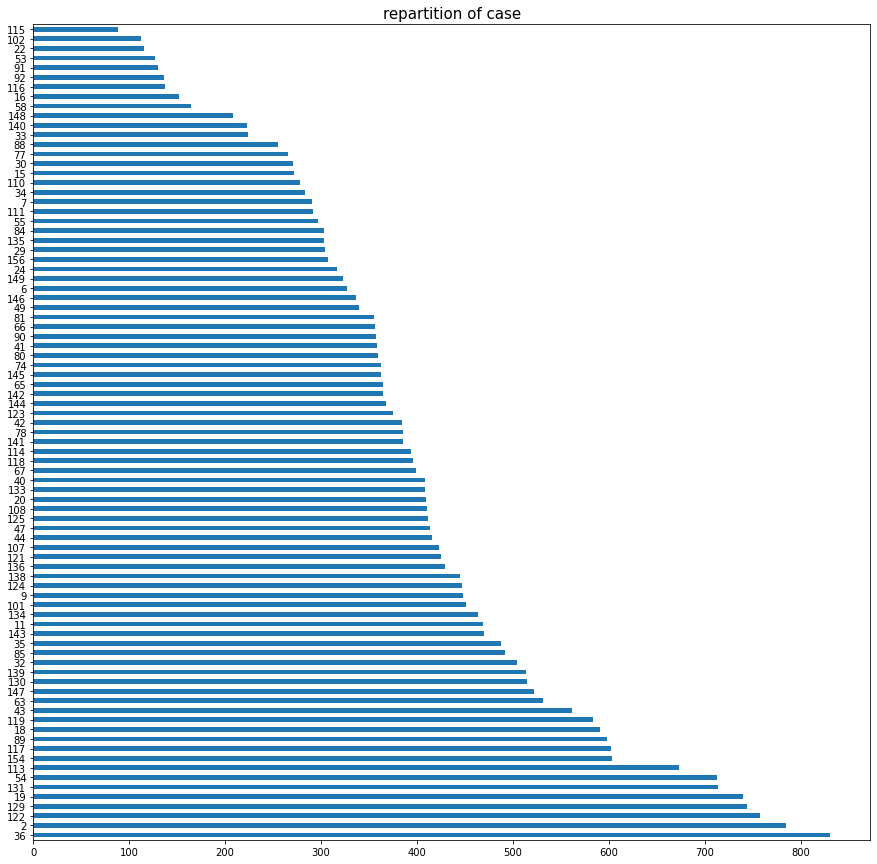

In [ ]:
fig = plt.figure(figsize=(15, 15))
df_with_mask['case_id'].value_counts().plot(kind='barh')
plt.title(str('repartition of case'),fontsize=15)

Text(0.5, 1.0, 'repartition of days traitment')

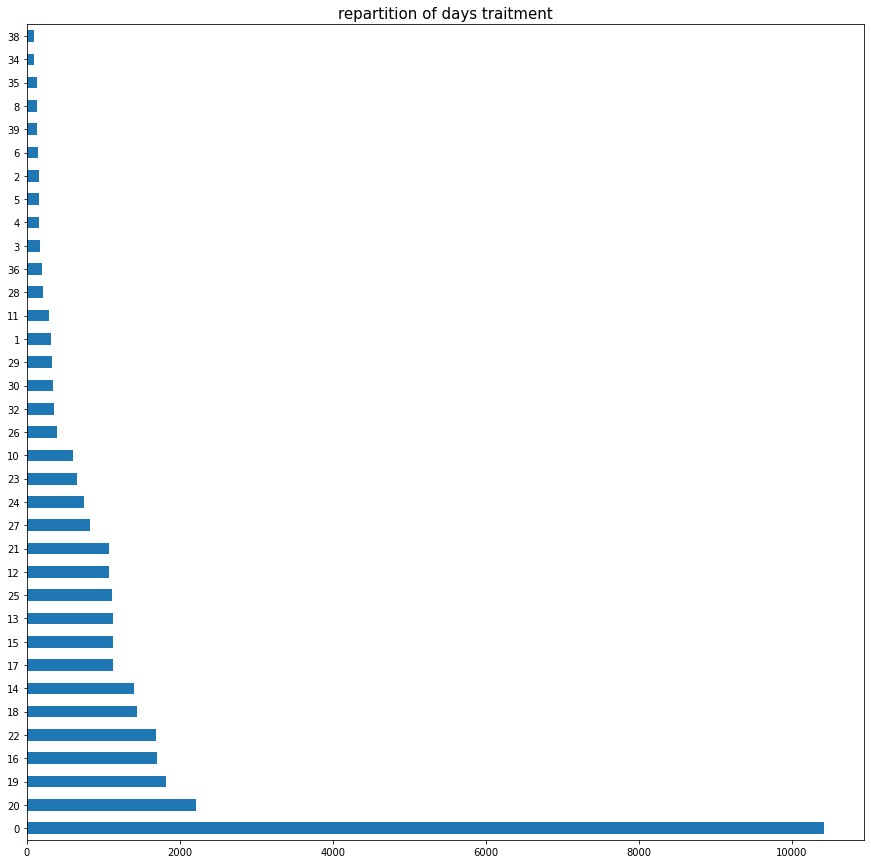

In [ ]:
fig = plt.figure(figsize=(15, 15))
df_with_mask['day_id'].value_counts().plot(kind='barh')
plt.title(str('repartition of days traitment'),fontsize=15)

Text(0.5, 1.0, 'repartition of slice_id ')

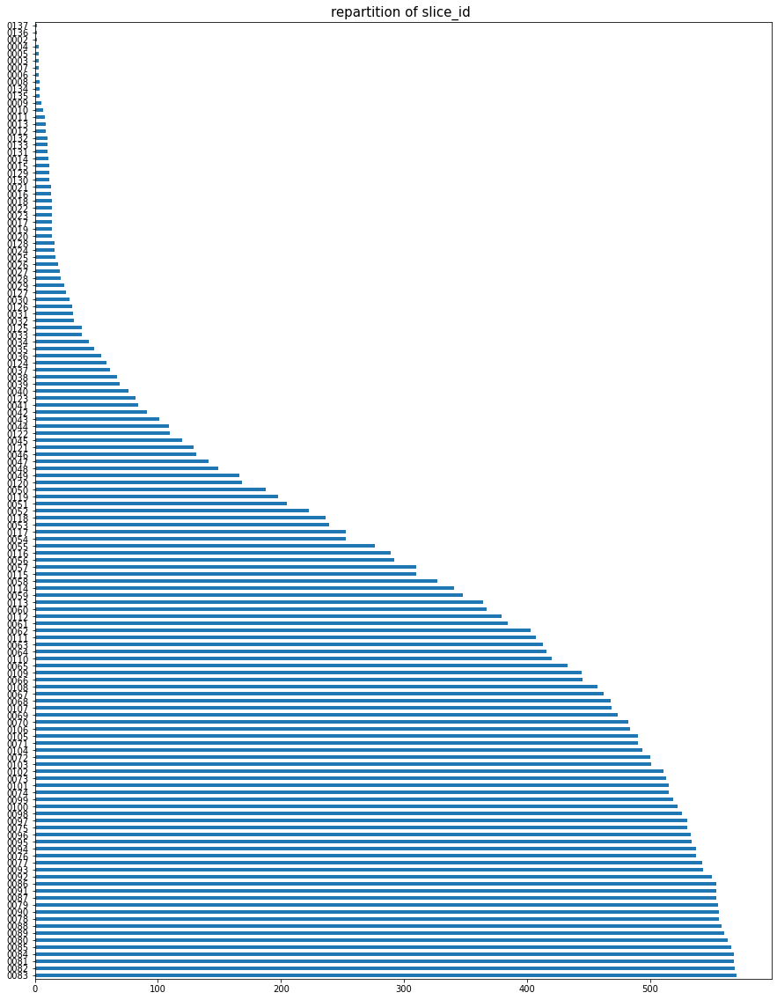

In [ ]:
fig = plt.figure(figsize=(15, 20))
df_with_mask['slice_id'].value_counts().plot(kind='barh')
plt.title(str('repartition of slice_id '),fontsize=15)

In [ ]:
pd.options.display.max_colwidth = 200
df_with_mask.path.head(1)[0]

'/content/uw-madison-gi-tract-image-segmentation/case123/case123_day20/scans/slice_0065_266_266_1.50_1.50.png'

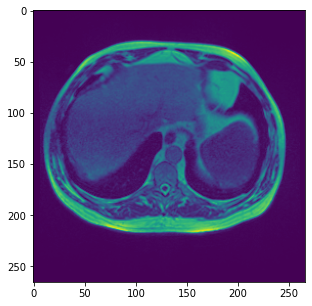

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
fig = plt.figure(figsize=(5, 5))
img = mpimg.imread(df_with_mask.path[0])
imgplot = plt.imshow(img)
plt.show()

In [ ]:
df_with_mask.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33913 entries, 0 to 33912
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   id            33913 non-null  object
 1   class         33913 non-null  object
 2   segmentation  33913 non-null  object
 3   case_id       33913 non-null  object
 4   day_id        33913 non-null  object
 5   slice_id      33913 non-null  object
 6   path          33913 non-null  object
 7   height        33913 non-null  int64 
 8   width         33913 non-null  int64 
 9   size          33913 non-null  object
dtypes: int64(2), object(8)
memory usage: 2.6+ MB


In [ ]:
df_with_mask['size'].value_counts()

266x266    22328
360x310     9911
276x276     1557
234x234      117
Name: size, dtype: int64

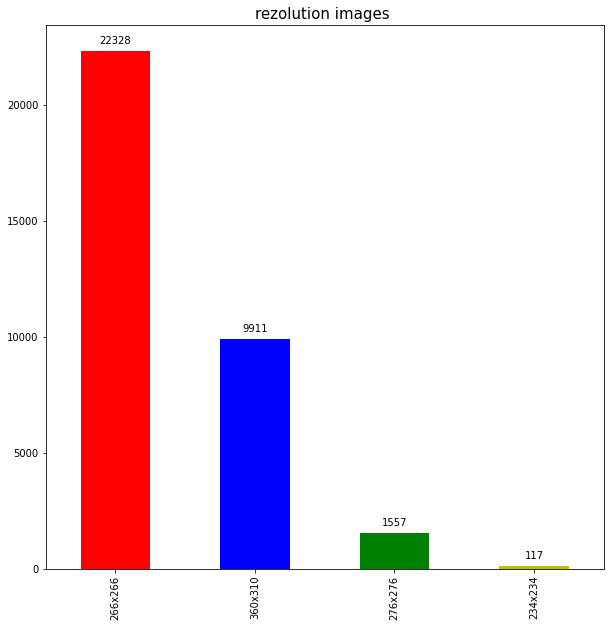

In [ ]:
from matplotlib import pyplot as plt
fig = plt.figure(figsize=(10, 10))
ax = df_with_mask['size'].value_counts().plot(kind='bar', color=['r','b','g','y']) 

for p in ax.patches:
    ax.annotate(
        #replace s to text in kaggle
                s=np.round(p.get_height(), decimals=2),
                xy=(p.get_x()+p.get_width()/2., p.get_height()),
                ha='center',
                va='center',
                xytext=(0, 10),
                textcoords='offset points')
plt.title(str('rezolution images '),fontsize=15)
plt.show()

In [ ]:
df_with_mask.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33913 entries, 0 to 33912
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   id            33913 non-null  object
 1   class         33913 non-null  object
 2   segmentation  33913 non-null  object
 3   case_id       33913 non-null  object
 4   day_id        33913 non-null  object
 5   slice_id      33913 non-null  object
 6   path          33913 non-null  object
 7   height        33913 non-null  int64 
 8   width         33913 non-null  int64 
 9   size          33913 non-null  object
dtypes: int64(2), object(8)
memory usage: 2.6+ MB


In [ ]:
df_with_mask['class'].value_counts()

large_bowel    14085
small_bowel    11201
stomach         8627
Name: class, dtype: int64

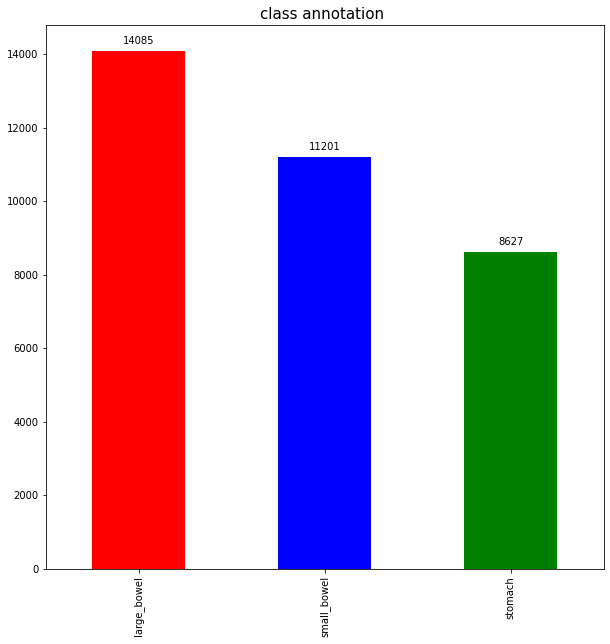

In [ ]:
fig = plt.figure(figsize=(10, 10))
ax = df_with_mask['class'].value_counts().plot(kind='bar', color=['r','b','g']) 

for p in ax.patches:
    ax.annotate(s=np.round(p.get_height(), decimals=2),
                xy=(p.get_x()+p.get_width()/2., p.get_height()),
                ha='center',
                va='center',
                xytext=(0, 10),
                textcoords='offset points')
plt.title(str('class annotation '),fontsize=15)
plt.show()

Text(0.5, 1.0, 'class annotation by case')

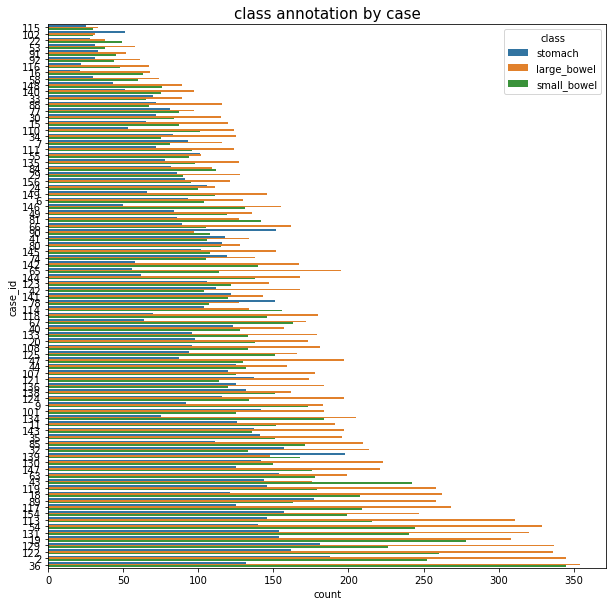

In [ ]:
plt.figure(figsize=(10,10))
ordre_quartier = df_with_mask.groupby('case_id')['class'].count().sort_values().index
sns.countplot(y="case_id",hue="class",data=df_with_mask, order=ordre_quartier)
plt.title(str('class annotation by case'),fontsize=15)

In [ ]:
df_with_mask.to_csv('/content/drive/MyDrive/UW_Madison_segmentation/madison.csv')

In [ ]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [9]:
!pip install pycocotools
!pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-ye3l7ced
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-ye3l7ced
     |████████████████████████████████| 50 kB 3.0 MB/s 
     |████████████████████████████████| 74 kB 3.7 MB/s 
     |████████████████████████████████| 151 kB 47.9 MB/s 
     |████████████████████████████████| 130 kB 88.7 MB/s 
     |████████████████████████████████| 38.1 MB 1.2 MB/s 
     |████████████████████████████████| 843 kB 74.6 MB/s 
     |████████████████████████████████| 749 kB 82.4 MB/s 
     |████████████████████████████████| 596 kB 90.7 MB/s 
     |████████████████████████████████| 77 kB 7.1 MB/s 
     |████████████████████████████████| 117 kB 97.6 MB/s 
INFO: pip is looking at multiple versions of mypy-extensions to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of iopath to determine which v

In [10]:
def rle_decode(mask_rle, shape):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return 
    Returns numpy array, 1 - mask, 0 - background

    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape)  # Needed to align to RLE direction

# From https://newbedev.com/encode-numpy-array-using-uncompressed-rle-for-coco-dataset
def binary_mask_to_rle(binary_mask):
    rle = {'counts': [], 'size': list(binary_mask.shape)}
    counts = rle.get('counts')
    for i, (value, elements) in enumerate(itertools.groupby(binary_mask.ravel(order='F'))):
        if i == 0 and value == 1:
            counts.append(0)
        counts.append(len(list(elements)))
    return rle

def create_coco_format_json(data_frame, classes, filepaths):
    images = []
    annotations = []
    categories = []
    count = 0
    
    # Additing categories
    for idx, class_ in enumerate(classes):
        categories.append(
            { 
                "id": idx,
                "name": class_
            }
        )

    for filepath in tqdm(filepaths):
        file_id = ('_'.join((filepath.split("/")[-3] + "_" + filepath.split("/")[-1]).split("_")[:-4]))
        height_slice = int(filepath.split("/")[-1].split("_")[3])
        width_slice = int(filepath.split("/")[-1].split("_")[2])
        ids = data_frame.index[data_frame['id'] == file_id].tolist()
        # file_name = '/'.join(filepath.split("/")[2:])
        file_name = '/'.join(filepath.split("/")[3:])
        # print('/'.join(filepath.split("/")[2:]))
        if (len(ids) > 0):
            # Adding images which has annotations
            images.append(
                {
                    "id":file_id,
                    "width":width_slice,
                    "height":height_slice,
                    "file_name": file_name
                }
            )
            for idx in ids:
                mk = rle_decode(data_frame.iloc[idx]['segmentation'], (height_slice, width_slice))
                ys, xs = np.where(mk)
                x1, x2 = min(xs), max(xs)
                y1, y2 = min(ys), max(ys)              
                contours,hierarchy = cv2.findContours(mk,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_NONE)
                for id_, contour in enumerate(contours):
                    mask_image = np.zeros((mk.shape[0], mk.shape[1], 3),  np.uint8)
                    cv2.drawContours(mask_image, [contour], -1, (255,255,255), thickness=cv2.FILLED)
                    mask_image = cv2.cvtColor(mask_image, cv2.COLOR_BGR2GRAY)
                    mask_image_bool = np.array(mask_image, dtype=bool).astype(np.uint8)
                    ys, xs = np.where(mask_image_bool)
                    x1, x2 = min(xs), max(xs)
                    y1, y2 = min(ys), max(ys)
                    enc =binary_mask_to_rle(mask_image_bool)
                    seg = {
                        'segmentation':enc, 
                        'bbox': [int(x1), int(y1), int(x2-x1+1), int(y2-y1+1)],
                        'area': int(np.sum(mask_image_bool)),
                        'image_id':file_id, 
                        'category_id':classes.index(data_frame.iloc[idx]['class']), 
                        'iscrowd':0, 
                        'id': count
                    }
                    annotations.append(seg)
                    count +=1
            
    # creating the dataset
    dataset_coco_format = {
        "categories": categories,
        "images": images,
        "annotations": annotations,
    }
    
    return dataset_coco_format

In [11]:
len(df_with_mask)

33913

In [ ]:
# train_size = 0.6
# validate_size = 0.2
# train_df, val_df, test_df = np.split(df_with_mask.sample(frac=1), [int(train_size * len(df_with_mask)), int((validate_size + train_size) * len(df_with_mask))])
# train_df = train_df.reset_index(drop=True)
# val_df = val_df.reset_index(drop=True)
# test_df = test_df.reset_index(drop=True)

# # print(train_df.head())
# print("\n \nNumber of Train Images:{}".format(len(train_df)))
# print("Number of Val Images:{}".format(len(val_df)))
# print("Number of Test Images:{}".format(len(test_df)))


 
Number of Train Images:20347
Number of Val Images:6783
Number of Test Images:6783


In [ ]:
# Creation of train test split
train_df, test_df = train_test_split(df_with_mask, test_size=0.2)
train_df = train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

# print(train_df.head())
print("\n \nNumber of Train Images:{}".format(len(train_df)))
print("Number of Test Images:{}".format(len(test_df)))


 
Number of Train Images:27130
Number of Test Images:6783


In [ ]:
df_with_mask['class'].unique()

array(['stomach', 'large_bowel', 'small_bowel'], dtype=object)

In [ ]:
classes = ['small_bowel', 'large_bowel', 'stomach']

filepaths = list()
for (dirpath, dirnames, filenames) in os.walk(dataset_path):
    filepaths += [os.path.join(dirpath, file) for file in filenames if file.endswith(".png")]
    
train_json = create_coco_format_json(train_df, classes, filepaths)
test_json = create_coco_format_json(test_df, classes, filepaths)
# val_json = create_coco_format_json(val_df, classes, filepaths)

100%|██████████| 38496/38496 [02:16<00:00, 281.51it/s]


In [ ]:
test_json

# Saving the train and test json

In [ ]:
# Code taken from: https://stackoverflow.com/a/65151218/12890869
def np_encoder(object):
    if isinstance(object, np.generic):
        return object.item()
    
with open('working/train_json.json', 'w', encoding='utf-8') as f:
    json.dump(train_json, f, ensure_ascii=True, indent=4, default=np_encoder)

# with open('working/val_json.json', 'w', encoding='utf-8') as f:
#     json.dump(val_json, f, ensure_ascii=True, indent=4, default=np_encoder)    
    
with open('working/test_json.json', 'w', encoding='utf-8') as f:
    json.dump(test_json, f, ensure_ascii=True, indent=4, default=np_encoder)

In [ ]:
!cp /content/working/test_json.json /content/drive/MyDrive//UW_Madison_segmentation/test_json.json
!cp /content/working/train_json.json /content/drive/MyDrive//UW_Madison_segmentation/train_json.json
# !cp /content/working/val_json.json /content/drive/MyDrive//UW_Madison_segmentation/val_json.json

In [12]:
# !cp  /content/drive/MyDrive//UW_Madison_segmentation/test_json.json /content/working/test_json.json
# !cp  /content/drive/MyDrive//UW_Madison_segmentation/train_json.json /content/working/train_json.json
# !cp  /content/drive/MyDrive//UW_Madison_segmentation/val_json.json /content/working/val_json.json

# Visualization with Detectron2

In [13]:
from pathlib import Path
from detectron2.data.datasets import register_coco_instances
from detectron2.data import DatasetCatalog, MetadataCatalog
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode

output_path = os.path.abspath("/content/working/")
Data_Resister_training="train"
Data_Resister_testing="test"
# Data_Resister_val="val"

if Data_Resister_training in DatasetCatalog.list():
    DatasetCatalog.remove(Data_Resister_training)
# if Data_Resister_val in DatasetCatalog.list():
#     DatasetCatalog.remove(Data_Resister_val)    
if Data_Resister_testing in DatasetCatalog.list():
    DatasetCatalog.remove(Data_Resister_testing)

register_coco_instances(
    Data_Resister_training,
    {}, 
    os.path.join(output_path, "train_json.json"), 
    dataset_path)

# register_coco_instances(
#     Data_Resister_val,
#     {}, 
#     os.path.join(output_path, "val_json.json"), 
#     dataset_path)

register_coco_instances(
    Data_Resister_testing,
    {}, 
    os.path.join(output_path, "test_json.json"), 
    dataset_path)

# MetadataCatalog.get("val").set(thing_classes= ['stomach', 'large_bowel', 'small_bowel'])

my_dataset_train_metadata = MetadataCatalog.get(Data_Resister_training)
# my_dataset_val_metadata = MetadataCatalog.get(Data_Resister_val)
my_dataset_test_metadata = MetadataCatalog.get(Data_Resister_testing)
# MetadataCatalog.get("train").set(thing_classes= ['stomach', 'large_bowel', 'small_bowel'])

dataset_train = DatasetCatalog.get(Data_Resister_training)
# dataset_val = DatasetCatalog.get(Data_Resister_val)
dataset_test = DatasetCatalog.get(Data_Resister_testing)


Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.


Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



In [14]:
my_dataset_train_metadata

Metadata(evaluator_type='coco', image_root='/content/uw-madison-gi-tract-image-segmentation', json_file='/content/working/train_json.json', name='train', thing_classes=['small_bowel', 'large_bowel', 'stomach'], thing_dataset_id_to_contiguous_id={0: 0, 1: 1, 2: 2})

/content/uw-madison-gi-tract-image-segmentation/case36/case36_day14/scans/slice_0069_266_266_1.50_1.50.png
/content/uw-madison-gi-tract-image-segmentation/case63/case63_day26/scans/slice_0089_266_266_1.50_1.50.png
/content/uw-madison-gi-tract-image-segmentation/case2/case2_day1/scans/slice_0116_266_266_1.50_1.50.png
/content/uw-madison-gi-tract-image-segmentation/case43/case43_day20/scans/slice_0084_266_266_1.50_1.50.png
/content/uw-madison-gi-tract-image-segmentation/case63/case63_day22/scans/slice_0103_266_266_1.50_1.50.png
/content/uw-madison-gi-tract-image-segmentation/case136/case136_day25/scans/slice_0086_360_310_1.50_1.50.png
/content/uw-madison-gi-tract-image-segmentation/case111/case111_day19/scans/slice_0082_266_266_1.50_1.50.png
/content/uw-madison-gi-tract-image-segmentation/case125/case125_day0/scans/slice_0089_266_266_1.50_1.50.png
/content/uw-madison-gi-tract-image-segmentation/case119/case119_day0/scans/slice_0097_360_310_1.50_1.50.png
/content/uw-madison-gi-tract-image

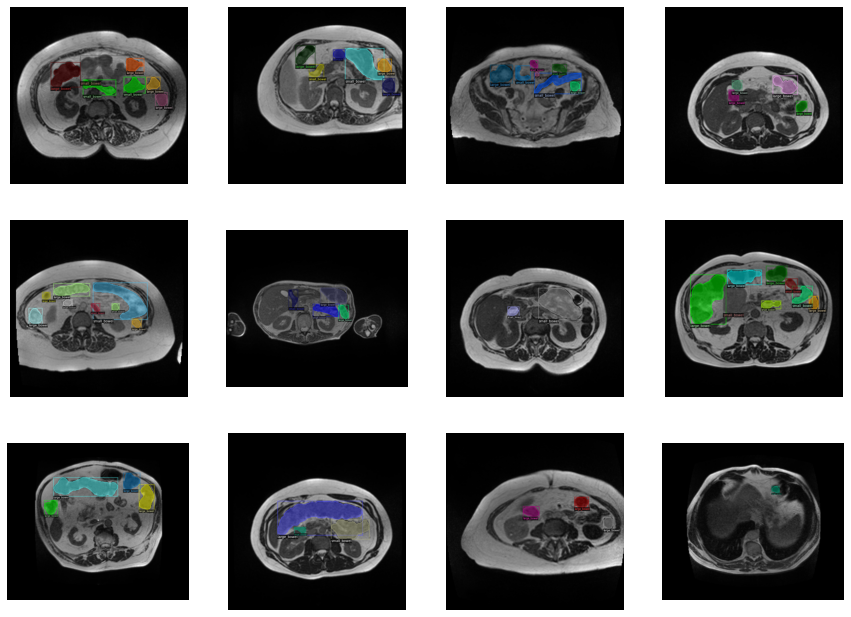

In [15]:
plt.figure(figsize=(15,15))
for i, idx in enumerate(random.sample(range(0, len(dataset_train)), 12)):
    d=dataset_train[idx]
    print(d["file_name"])
    gray_image = cv2.imread(d["file_name"], cv2.IMREAD_ANYDEPTH)
    gray_image = gray_image / gray_image.max()
    img = np.repeat(gray_image[..., np.newaxis], 3, -1) * 255.0
    v = Visualizer(img,
                    metadata=my_dataset_train_metadata, 
                    scale=2,
                    instance_mode=ColorMode.IMAGE_BW
        )
    out = v.draw_dataset_dict(d)
    plt.subplot(4, 4, i+1)
    plt.imshow(out.get_image())
    plt.axis('off')
plt.show()

(266, 266, 3)


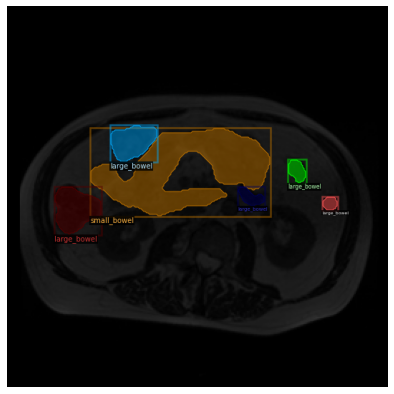

In [16]:
fig, ax = plt.subplots(figsize =(15,7))
d=dataset_train[500] 
img = cv2.imread(d["file_name"])
print(img.shape)
v = Visualizer(img[:, :, ::-1],
                metadata=my_dataset_train_metadata, 
                scale=2,
                instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
out = v.draw_dataset_dict(d)
ax.grid(False)
ax.axis('off')
ax.imshow(out.get_image()[:, :, ::-1])

(310, 360, 3)


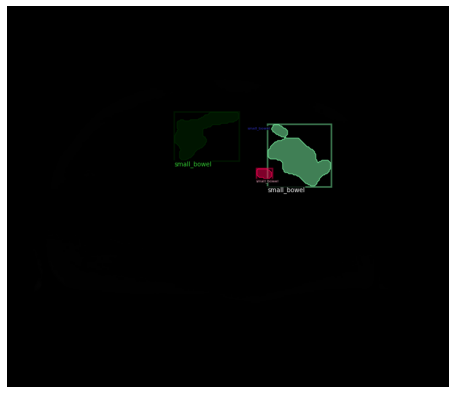

In [17]:
fig, ax = plt.subplots(figsize =(15,7))
d=dataset_train[1000] 
img = cv2.imread(d["file_name"])
print(img.shape)
v = Visualizer(img[:, :, ::-1],
                metadata=my_dataset_train_metadata, 
                scale=2,
                instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
out = v.draw_dataset_dict(d)
ax.grid(False)
ax.axis('off')
ax.imshow(out.get_image()[:, :, ::-1])

In [19]:
import logging
import torch
from collections import OrderedDict
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultTrainer
from detectron2.utils.visualizer import ColorMode
from detectron2.solver import build_lr_scheduler, build_optimizer
from detectron2.checkpoint import DetectionCheckpointer, PeriodicCheckpointer
from detectron2.utils.events import EventStorage
from detectron2.modeling import build_model
import detectron2.utils.comm as comm
from detectron2.engine import default_argument_parser, default_setup, default_writers, launch
from detectron2.data import (
    MetadataCatalog,
    build_detection_test_loader,
    build_detection_train_loader,
)
from detectron2.evaluation import (
    CityscapesInstanceEvaluator,
    CityscapesSemSegEvaluator,
    COCOEvaluator,
    COCOPanopticEvaluator,
    DatasetEvaluators,
    LVISEvaluator,
    PascalVOCDetectionEvaluator,
    SemSegEvaluator,
    inference_on_dataset,
    print_csv_format,
)

In [20]:
!rm -rf /content/output/
!rm -rf /content/coco_eval/

In [21]:
cfg = get_cfg()
config_name = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml" 
cfg.merge_from_file(model_zoo.get_config_file(config_name))
cfg.DATASETS.TRAIN = (Data_Resister_training,)
cfg.DATASETS.TEST = (Data_Resister_testing,)

# cfg.MODEL.WEIGHTS ="/content/drive/MyDrive/UW_Madison_segmentation/model_final_batch_128_noaugm.pth"

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml") 

cfg.DATALOADER.NUM_WORKERS = 8
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3 
cfg.SOLVER.IMS_PER_BATCH = 4 
cfg.INPUT.MASK_FORMAT='bitmask'
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5

cfg.SOLVER.BASE_LR = 0.0025 #(quite high base learning rate but should drop)
    
cfg.SOLVER.WARMUP_ITERS = 10 #How many iterations to go from 0 to reach base LR
cfg.SOLVER.MAX_ITER = 2500 #Maximum of iterations 1
cfg.SOLVER.STEPS = (1000, 1500) #At which point to change the LR 0.25,0.5
cfg.TEST.EVAL_PERIOD = 250
#cfg.SOLVER.CHECKPOINT_PERIOD=250
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [22]:
MetadataCatalog.get("train")

Metadata(evaluator_type='coco', image_root='/content/uw-madison-gi-tract-image-segmentation', json_file='/content/working/train_json.json', name='train', thing_classes=['small_bowel', 'large_bowel', 'stomach'], thing_dataset_id_to_contiguous_id={0: 0, 1: 1, 2: 2})

In [25]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [26]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
# Augmentation Visualization
train_data_loader = trainer.build_train_loader(cfg)
data_iter = iter(train_data_loader)
batch = next(data_iter)
trainer.resume_or_load(resume=False)
trainer.train()

[05/23 13:52:09 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.7/dist-packages/detectron2/data/detection_utils.py:433: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  ../torch/csrc/utils/tensor_numpy.cpp:178.)
  torch.stack([torch.from_numpy(np.ascontiguousarray(x)) for x in masks])
/usr/local/lib/python3.7/dist-packages/detectron2/data/detection_utils.py:433: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Trig

[05/23 13:52:26 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/data/detection_utils.py:433: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  ../torch/csrc/utils/tensor_numpy.cpp:178.)
  torch.stack([torch.from_numpy(np.ascontiguousarray(x)) for x in masks])
/usr/local/lib/python3.7/dist-packages/detectron2/data/detection_utils.py:433: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Trig

[05/23 13:52:34 d2.utils.events]:  eta: 0:17:13  iter: 19  total_loss: 2.121  loss_cls: 0.6146  loss_box_reg: 0.5164  loss_mask: 0.6626  loss_rpn_cls: 0.2275  loss_rpn_loc: 0.03787  time: 0.4129  data_time: 0.0331  lr: 0.0025  max_mem: 3717M
[05/23 13:52:43 d2.utils.events]:  eta: 0:17:04  iter: 39  total_loss: 1.849  loss_cls: 0.5952  loss_box_reg: 0.6614  loss_mask: 0.4895  loss_rpn_cls: 0.1014  loss_rpn_loc: 0.03632  time: 0.4147  data_time: 0.0108  lr: 0.0025  max_mem: 3717M
[05/23 13:52:51 d2.utils.events]:  eta: 0:16:51  iter: 59  total_loss: 1.748  loss_cls: 0.54  loss_box_reg: 0.6282  loss_mask: 0.5128  loss_rpn_cls: 0.07855  loss_rpn_loc: 0.02686  time: 0.4128  data_time: 0.0105  lr: 0.0025  max_mem: 3717M
[05/23 13:52:59 d2.utils.events]:  eta: 0:16:42  iter: 79  total_loss: 1.73  loss_cls: 0.5348  loss_box_reg: 0.6388  loss_mask: 0.4602  loss_rpn_cls: 0.06219  loss_rpn_loc: 0.02647  time: 0.4126  data_time: 0.0109  lr: 0.0025  max_mem: 3717M
[05/23 13:53:08 d2.utils.events]:

In [27]:
# Look at training curves in tensorboard:
%reload_ext tensorboard
# %tensorboard --logdir ouput
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [44]:
metrics_df = pd.read_json( "/content/output/metrics.json", orient="records", lines=True)
mdf = metrics_df.sort_values("iteration")
mdf

,data_time,eta_seconds,fast_rcnn/cls_accuracy,fast_rcnn/false_negative,fast_rcnn/fg_cls_accuracy,iteration,loss_box_reg,loss_cls,loss_mask,loss_rpn_cls,...,bbox/APs,segm/AP,segm/AP-large_bowel,segm/AP-small_bowel,segm/AP-stomach,segm/AP50,segm/AP75,segm/APl,segm/APm,segm/APs
0,0.011364,1033.738944,0.830078,1.000000,0.000000,19,0.516436,0.614568,0.662596,0.227466,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.010713,1024.065705,0.817383,0.995238,0.004762,39,0.661423,0.595227,0.489481,0.101363,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.010859,1011.046744,0.828125,0.865245,0.065362,59,0.628150,0.539997,0.512808,0.078551,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.011779,1002.382776,0.839844,0.829710,0.090210,79,0.638772,0.534785,0.460179,0.062186,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.009954,993.047312,0.833008,0.756052,0.151619,99,0.570961,0.553762,0.432076,0.055586,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126,0.011637,25.067568,0.843750,0.630181,0.330601,2439,0.531309,0.462528,0.437932,0.050684,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
127,0.011929,16.711109,0.866211,0.609238,0.359512,2459,0.547531,0.411711,0.414877,0.048791,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
128,0.012427,8.355554,0.876953,0.568198,0.408261,2479,0.463103,0.424638,0.385980,0.057469,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
129,0.012991,0.000000,0.838867,0.734405,0.252019,2499,0.607609,0.511304,0.450053,0.071922,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


0      0.830078
1      0.817383
2      0.828125
3      0.839844
4      0.833008
         ...   
125    0.833984
126    0.843750
127    0.866211
128    0.876953
129    0.838867
Name: fast_rcnn/cls_accuracy, Length: 125, dtype: float64


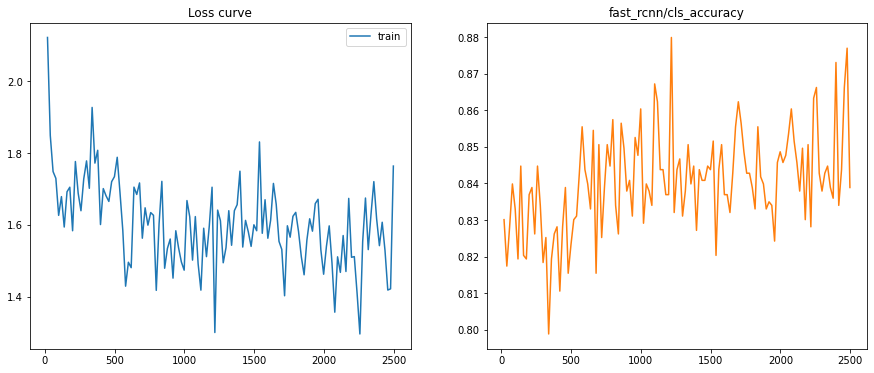

In [59]:
# 1. Loss curve
fig, ax = plt.subplots(1,2, figsize =(15,6))

mdf1 = mdf[~mdf["total_loss"].isna()]
ax[0].plot(mdf1["iteration"], mdf1["total_loss"], c="C0", label="train")

mdf2 = mdf[~mdf["fast_rcnn/cls_accuracy"].isna()]
ax[1].plot(mdf2["iteration"], mdf2["fast_rcnn/cls_accuracy"], c="C1", label="fast_rcnn/cls_accuracy")

# ax.set_ylim([0, 0.5])
ax[0].legend()
ax[0].set_title("Loss curve")
ax[1].set_title("fast_rcnn/cls_accuracy")
print (mdf2["fast_rcnn/cls_accuracy"] )
plt.show()


In [47]:
mdf.columns

Index(['data_time', 'eta_seconds', 'fast_rcnn/cls_accuracy',
       'fast_rcnn/false_negative', 'fast_rcnn/fg_cls_accuracy', 'iteration',
       'loss_box_reg', 'loss_cls', 'loss_mask', 'loss_rpn_cls', 'loss_rpn_loc',
       'lr', 'mask_rcnn/accuracy', 'mask_rcnn/false_negative',
       'mask_rcnn/false_positive', 'roi_head/num_bg_samples',
       'roi_head/num_fg_samples', 'rpn/num_neg_anchors', 'rpn/num_pos_anchors',
       'time', 'total_loss', 'bbox/AP', 'bbox/AP-large_bowel',
       'bbox/AP-small_bowel', 'bbox/AP-stomach', 'bbox/AP50', 'bbox/AP75',
       'bbox/APl', 'bbox/APm', 'bbox/APs', 'segm/AP', 'segm/AP-large_bowel',
       'segm/AP-small_bowel', 'segm/AP-stomach', 'segm/AP50', 'segm/AP75',
       'segm/APl', 'segm/APm', 'segm/APs'],
      dtype='object')

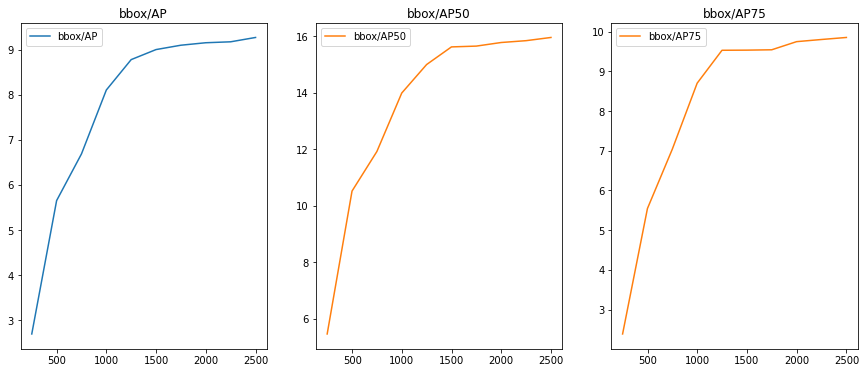

In [64]:
# 1. Loss curve
fig, ax = plt.subplots(1,3, figsize =(15,6))

mdf1 = mdf[~mdf["bbox/AP"].isna()]
ax[0].plot(mdf1["iteration"], mdf1["bbox/AP"], c="C0", label="bbox/AP")

mdf2 = mdf[~mdf["bbox/AP50"].isna()]
ax[1].plot(mdf2["iteration"], mdf2["bbox/AP50"], c="C1", label="bbox/AP50")

mdf3 = mdf[~mdf["bbox/AP75"].isna()]
ax[2].plot(mdf3["iteration"], mdf3["bbox/AP75"], c="C1", label="bbox/AP75")

# ax.set_ylim([0, 0.5])
ax[0].legend()
ax[1].legend()
ax[2].legend()
ax[0].set_title("bbox/AP")
ax[1].set_title("bbox/AP50")
ax[2].set_title("bbox/AP75")
plt.show()


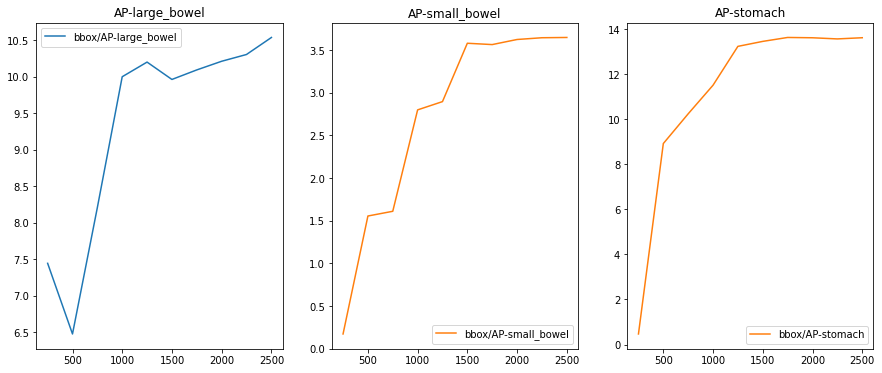

In [61]:
# 1. Loss curve
fig, ax = plt.subplots(1,3, figsize =(15,6))

mdf1 = mdf[~mdf["bbox/AP-large_bowel"].isna()]
ax[0].plot(mdf1["iteration"], mdf1["bbox/AP-large_bowel"], c="C0", label="bbox/AP-large_bowel")

mdf2 = mdf[~mdf["bbox/AP-small_bowel"].isna()]
ax[1].plot(mdf2["iteration"], mdf2["bbox/AP-small_bowel"], c="C1", label="bbox/AP-small_bowel")

mdf3 = mdf[~mdf["bbox/AP-stomach"].isna()]
ax[2].plot(mdf3["iteration"], mdf3["bbox/AP-stomach"], c="C1", label="bbox/AP-stomach")

# ax.set_ylim([0, 0.5])
ax[0].legend()
ax[1].legend()
ax[2].legend()
ax[0].set_title("AP-large_bowel")
ax[1].set_title("AP-small_bowel")
ax[2].set_title("AP-stomach")
plt.show()


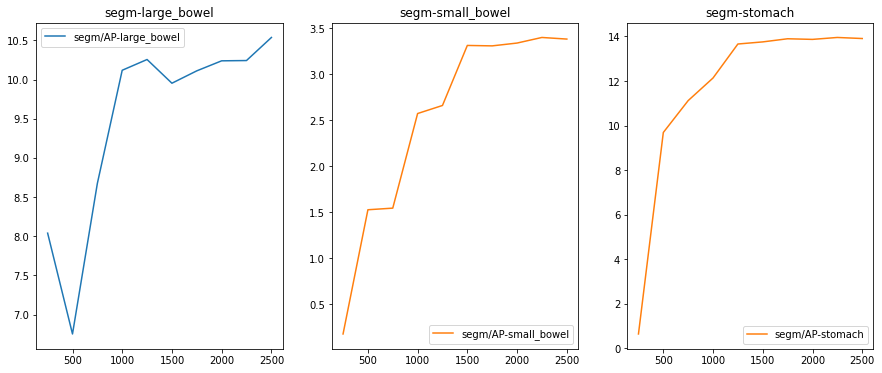

In [57]:
# 1. Loss curve
fig, ax = plt.subplots(1,3, figsize =(15,6))

mdf1 = mdf[~mdf["segm/AP-large_bowel"].isna()]
ax[0].plot(mdf1["iteration"], mdf1["segm/AP-large_bowel"], c="C0", label="segm/AP-large_bowel")

mdf2 = mdf[~mdf["segm/AP-small_bowel"].isna()]
ax[1].plot(mdf2["iteration"], mdf2["segm/AP-small_bowel"], c="C1", label="segm/AP-small_bowel")

mdf3 = mdf[~mdf["segm/AP-stomach"].isna()]
ax[2].plot(mdf3["iteration"], mdf3["segm/AP-stomach"], c="C1", label="segm/AP-stomach")

# ax.set_ylim([0, 0.5])
ax[0].legend()
ax[1].legend()
ax[2].legend()
ax[0].set_title("segm-large_bowel")
ax[1].set_title("segm-small_bowel")
ax[2].set_title("segm-stomach")
plt.show()


In [28]:
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[05/23 15:07:59 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

OrderedDict([('bbox',
              {'AP': 9.267870316114395,
               'AP-large_bowel': 10.536022302495745,
               'AP-small_bowel': 3.64813273297408,
               'AP-stomach': 13.619455912873363,
               'AP50': 15.951996359035375,
               'AP75': 9.854646296937759,
               'APl': nan,
               'APm': 9.17240474889546,
               'APs': 9.44141537205501}),
             ('segm',
              {'AP': 9.27367086263607,
               'AP-large_bowel': 10.536583589537516,
               'AP-small_bowel': 3.3802841453885555,
               'AP-stomach': 13.904144852982137,
               'AP50': 15.774403170676957,
               'AP75': 10.129132598264006,
               'APl': nan,
               'APm': 11.708671582863982,
               'APs': 7.987028932877383})])

In [29]:
MetadataCatalog.get("train").set(thing_classes=['small_bowel', 'large_bowel', 'stomach'])
MetadataCatalog.get("test").set(thing_classes=['small_bowel', 'large_bowel', 'stomach'])
# MetadataCatalog.get("val").set(thing_classes=['small_bowel', 'large_bowel', 'stomach'])

Metadata(evaluator_type='coco', image_root='/content/uw-madison-gi-tract-image-segmentation', json_file='/content/working/test_json.json', name='test', thing_classes=['small_bowel', 'large_bowel', 'stomach'], thing_dataset_id_to_contiguous_id={0: 0, 1: 1, 2: 2})

[05/23 16:23:32 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

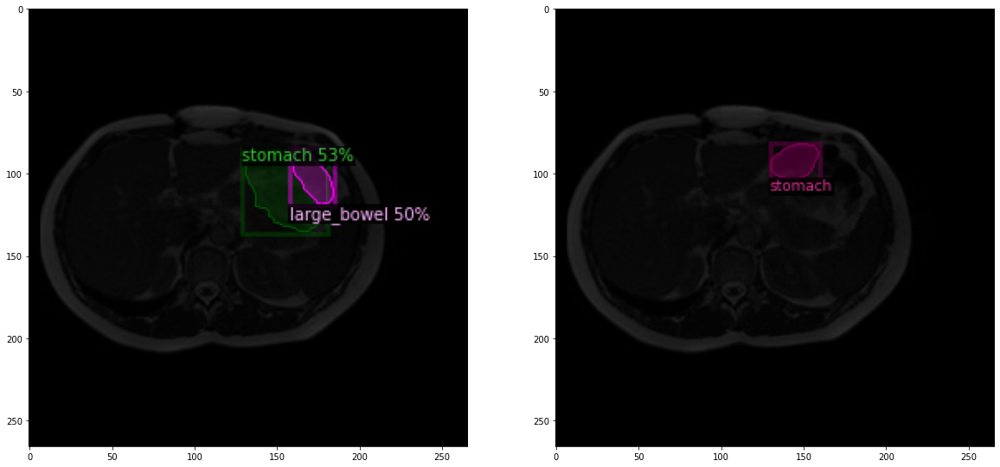

In [107]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)
dataset_dicts = DatasetCatalog.get('test')

outs = []
for d in random.sample(dataset_dicts, 1):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im) 
    nb_sgm = 0
    while nb_sgm == 0:
      t = random.sample(dataset_dicts, 1)[0]
      im = cv2.imread(t["file_name"])
      outputs = predictor(im)
      nb_sgm = len(outputs['instances'])

    d=t
    v = Visualizer(im[:, :, ::-1],
                  metadata = MetadataCatalog.get('train'),                     
                  instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out_pred = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    visualizer = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get('train'))
    out_target = visualizer.draw_dataset_dict(d)
    outs.append(out_pred)
    outs.append(out_target)

_,axs = plt.subplots(len(outs)//2,2,figsize=(20,20))
for ax, out in zip(axs.reshape(-1), outs):
    ax.imshow(out.get_image()[:, :, ::-1])


[05/23 16:45:29 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

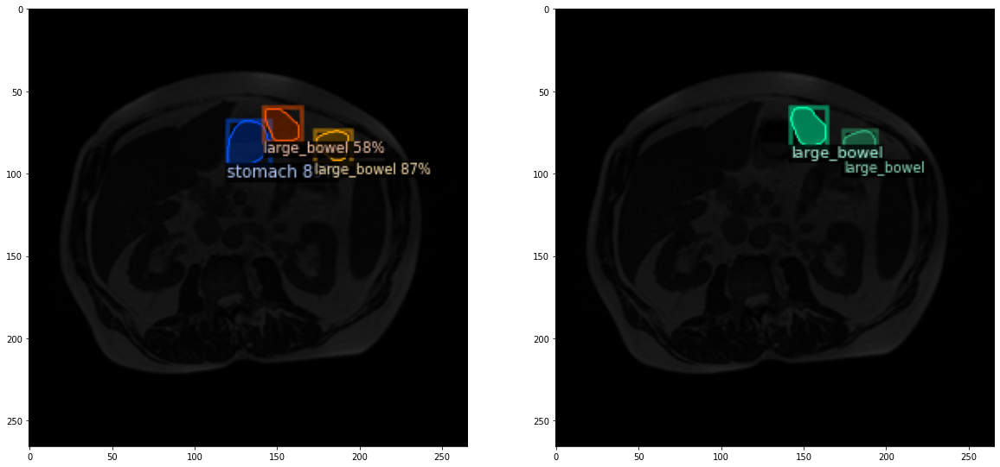

In [114]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)
dataset_dicts = DatasetCatalog.get('test')

outs = []
for d in random.sample(dataset_dicts, 1):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im) 
    nb_sgm = 0
    while nb_sgm == 0:
      t = random.sample(dataset_dicts, 1)[0]
      im = cv2.imread(t["file_name"])
      outputs = predictor(im)
      nb_sgm = len(outputs['instances'])

    d=t
    v = Visualizer(im[:, :, ::-1],
                  metadata = MetadataCatalog.get('train'),                     
                  instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out_pred = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    visualizer = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get('train'))
    out_target = visualizer.draw_dataset_dict(d)
    outs.append(out_pred)
    outs.append(out_target)

_,axs = plt.subplots(len(outs)//2,2,figsize=(20,20))
for ax, out in zip(axs.reshape(-1), outs):
    ax.imshow(out.get_image()[:, :, ::-1])


[05/23 16:44:49 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

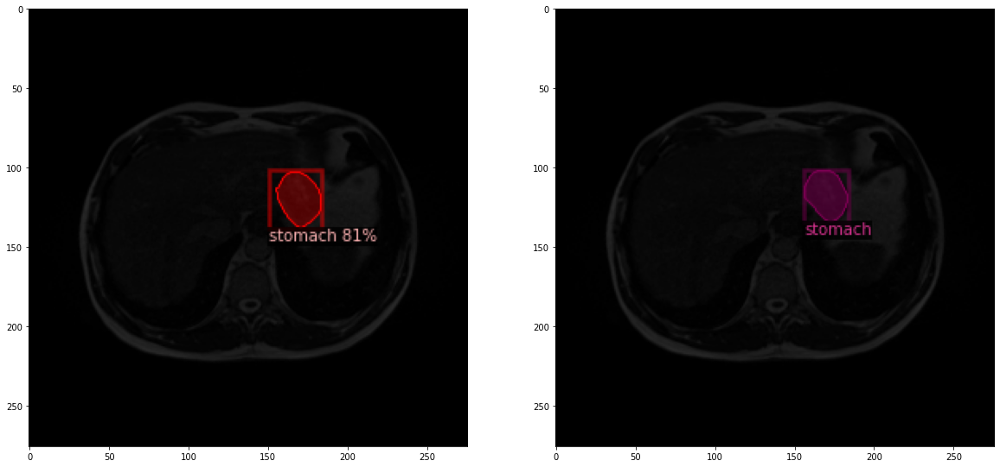

In [112]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)
dataset_dicts = DatasetCatalog.get('test')

outs = []
for d in random.sample(dataset_dicts, 1):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im) 
    nb_sgm = 0
    while nb_sgm == 0:
      t = random.sample(dataset_dicts, 1)[0]
      im = cv2.imread(t["file_name"])
      outputs = predictor(im)
      nb_sgm = len(outputs['instances'])

    d=t
    v = Visualizer(im[:, :, ::-1],
                  metadata = MetadataCatalog.get('train'),                     
                  instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out_pred = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    visualizer = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get('train'))
    out_target = visualizer.draw_dataset_dict(d)
    outs.append(out_pred)
    outs.append(out_target)

_,axs = plt.subplots(len(outs)//2,2,figsize=(20,20))
for ax, out in zip(axs.reshape(-1), outs):
    ax.imshow(out.get_image()[:, :, ::-1])


In [110]:
my_dataset_train_metadata

Metadata(evaluator_type='coco', image_root='/content/uw-madison-gi-tract-image-segmentation', json_file='/content/working/train_json.json', name='train', thing_classes=['small_bowel', 'large_bowel', 'stomach'], thing_dataset_id_to_contiguous_id={0: 0, 1: 1, 2: 2})

In [111]:
!cp /content/output/model_final.pth /content/drive/MyDrive/UW_Madison_segmentation/model_final_batch_128_augm.pth

In [ ]:
!cp '/content/output/events.out.tfevents.1653241020.fa0351605bd0.2086.3' /content/drive/MyDrive/UW_Madison_segmentation/events.out.tfevents